# Group Members:

<font color='blue'>**PUT NAMES OF YOUR TEAM MEMBERS HERE**

*   Luca Franceschi - u199149
*   Jan Corcho - u188244

# Guide

In this practice we will study a trick to deal with some non-differentiable functions. It is based in augmenting the objective function, including new variables. In the first part we will program two basic methods and test them with toy examples in a low dimensional setting. In the second part we apply this methodology to the minimization of a non-differentiable image denoising energy.

\\

For any doubts before and after the practice, you can contact your teacher:

Nneka Okolo - nnekamaureen.okolo@upf.edu

Pablo Arias - pablo.arias@upf.edu

Adriano Pastore - adriano.pastore@upf.edu

\\

**Pre-requisites:** Before the practice, you should review the following topics:

*   Min-max inequality, Von-Neuman min-max theorem
*   Duality for minimizing functions with non-differentiabilities

\\

**Deadlines**: See
[P101](https://calendar.google.com/calendar/embed?src=c_b679939a9db8a1d8cd9f01f62d373d173f76794e4137c40e793a8d2cb11708f8%40group.calendar.google.com&ctz=Europe%2FMadrid/),
[P102](https://calendar.google.com/calendar/embed?src=c_5a65338fe8c3ce7909e62bb6b572b1a61ff4ad3543b12f72468e1a16bca41bd0%40group.calendar.google.com&ctz=Europe%2FMadrid),
[P201](https://calendar.google.com/calendar/embed?src=c_58aa336a0c5d0a38b13dd4a38071e7d8f9a18f4306ffeef2e48276087c339163%40group.calendar.google.com&ctz=Europe%2FMadrid),
[P202](https://calendar.google.com/calendar/embed?src=c_dac1d492e1060f3cee35420a9c2ff0d345e89a002cc8c70fe74bf0b78bf99d37%40group.calendar.google.com&ctz=Europe%2FMadrid),

\\

**Submission instructions**

Register your group members [here](https://forms.gle/NLeYqhN6LyPnSPg78) if you haven't already.

Complete the code and answer the questions below.

Export the notebook with the answers using the menu option File->Download .ipynb.

Rename exported notebook with the format **lastnameUid.ipynb** where lastname is the first surname of **Member 1** in the form and Uid is their UPF ID.

Submit your solution [here](https://forms.gle/AdYQwDEjAta1QaRY6) by the deadline. **Only one member needs to complete this step**.

You will receive an acknowledgement of receipt.

\\

**Grading**:

  The evaluation is based on results, conclusions and the commented code together.



[comment]: <> (Macros:)
$\newcommand{\m}{-}
\newcommand{\ma}[1]{\boldsymbol{#1}}
\newcommand{\tras}[1]{#1^{\mathrm{T}}}
\newcommand{\herm}[1]{#1^{\mathrm{H}}}
\newcommand{\con}[1]{#1^{\mathrm{*}}}
\newcommand{\E}{\mathbb{E}}
\newcommand{\tech}[1]{\overline{#1}}
\newcommand{\nspace}{\!\!\!\!}
\newcommand{\nmbr}[1]{\oldstylenums{#1}}
\newcommand{\eg}{\emph{e.g}. } \newcommand{\Eg}{\emph{E.g}. }
\newcommand{\ie}{\emph{i.e}. } \newcommand{\Ie}{\emph{I.e}. }
\newcommand{\cf}{\emph{c.f}. } \newcommand{\Cf}{\emph{C.f}. }
\newcommand{\etc}{\emph{etc}. } \newcommand{\vs}{\emph{vs}. }
\newcommand{\wrt}{w.r.t\onedot } \newcommand{\dof}{d.o.f. }
\newcommand{\etal}{\emph{et al}. }
\newcommand{\R}{\mathbb{R}}
\newcommand{\sign}{\mathrm{sign}}
\newcommand{\eps}{\varepsilon}
\newcommand{\To}{\longrightarrow}
\DeclareMathOperator*{\argmin}{arg\,min}
\DeclareMathOperator*{\argmax}{arg\,max}$

**Instructions for answering the questions.**

Questions are indicated in blue. Some questions require answers in the form of text, some others require completing code. See the examples below. *Please do not modify the notebook outside of these cells.*

<font color='blue'>**(QUESTION 42)** Based on what you know at this moment, answer these questions:
1. What are your favorite subjects?
2. What are your favourite hobbies?
</font>

<font color='red'>**ANSWER**</font>

1. I only like one subject: "Optimization Techniques."
1. I like writing equations $e^{i\pi} + 1 = 0$

<font color='blue'>**(QUESTION 43)** This is a coding question. There is no <font color='red'>**ANSWER**</font> cell. Instead, you should complete the code cell following the question. Typically, you'll find TODOs in the code indicating the places that you are expected to complete.
</font>

In [2]:
a = None     # TODO substitute the None by a nice number to print
print("The number a is {}".format(a))

The number a is None


In [3]:
# imports
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from IPython import display
#%matplotlib widget

# Min-max and max-min


Given a function of two variables $H:X\times Y \to \mathbb R$, duality relies on the relation between these two problems:
$$
  \min\limits_{x\in X} \max \limits_{y\in Y} H(x,y) \quad\quad\text{ and }\quad\quad \max \limits_{y\in Y} \min \limits_{x\in X} H(x,y).
$$

As seen in theory, the min-max inequality says that
$$
   \max \limits_{y\in Y} \min \limits_{x\in X} H(x,y) \leq \min\limits_{x\in X} \max \limits_{y\in Y} H(x,y).
$$

If we define the following functions:
$$
f(x) = \max_y H(x,y), \quad\quad g(y) = \min_x H(x,y),
$$
we have that:
$$
   g(y) \leq \max \limits_{y\in Y} \underbrace{\min \limits_{x\in X} H(x,y)}_{g(y)} \leq \min\limits_{x\in X} \underbrace{\max \limits_{y\in Y} H(x,y)}_{f(x)} \leq f(x).
$$
The dual gap is given by the following difference
$$
\text{DG}(x,y) = f(x) - g(y)
$$
and it is always non-negative. The smallest possible dual gap is the given by
$$
\text{DG}^* = \min_x f(x) - \max_y g(y).
$$
In some cases, the optimal dual gap is zero, and we have seen in theory that this is related with the existence of a saddle point $(x^*,y^*)$: a point which is a minimizer of $H$ with respecto $x$ and maximizer with respect to $y$:
$$ H(x^*,y) \leq H(x^*,y^*) \leq H(x,y^*).$$


In the first part of the lab we will visualize some functions $H$ of two variables defined over $[-4,4]\times [-4,4]$.




<font color='blue'>**(QUESTION 1)** Complete the code of the function `compute_dual_gap()` below.
</font>

In [4]:
def compute_dual_gap(x, y, H):
  """
  Computes the optimal dual gap for a discretized function of 2 variables.
  The input is a 2D np.array H with the values of a function over a rectangular
  2D grid.
  """

  max_y_H = np.max(H, axis= 0)  #hint use np.max, but identify which axis corresponds to y
  min_x_H =np.min(H, axis= 1)
 
  optimal_dual_gap =np.min(max_y_H) - np.max(min_x_H)

  # plot
  plt.plot(x, max_y_H, label='max_y H(x, y)')
  plt.plot(y, min_x_H, label='min_x H(x, y)')
  plt.grid()
  plt.legend()
  plt.show()

  return optimal_dual_gap

<font color='blue'>**(QUESTION 1.1)** Run the cells below, that will display plots of some functions of two variables.
- <font color='blue'> Determine visually which of the functions displayed presents a saddle point and which do not. In case there is a saddle-point provide its approximate coordinates.
- Which is the necessary condition seen in theory for the existence of a saddle point? Are these examples compatible with that necessary condition?

Insert your answers in the <font color='red'>**ANSWER**</font> box underneath.
</font>

In [5]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def surf_and_contour(x, y, H, label=None, fig_size=None, levels=60):

  fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'surface'}, {}]])

  fig.add_trace(go.Surface(x=x,y=y,z=H), row=1, col=1)
  fig.layout.scene.camera.projection.type = "orthographic"

  fig.update_layout(title=label, autosize=False,
                    width=1000, height=500,
                    margin=dict(l=65, r=50, b=65, t=90))

  fig.add_trace(go.Contour(x=x,y=y,z=H,
                           contours_coloring='lines',
                           ncontours=40,
                           line_width=1), row=1, col=2)

  fig.update_yaxes(scaleanchor="x", scaleratio=1)

  fig.show()


# Define the grid
start = -5
stop = 5
step = .05
x = np.arange(start = start, stop = stop + step, step = step)
y = np.arange(start = start, stop = stop + step, step = step)

# Create the mesh grid
xx, yy = np.meshgrid(x, y)

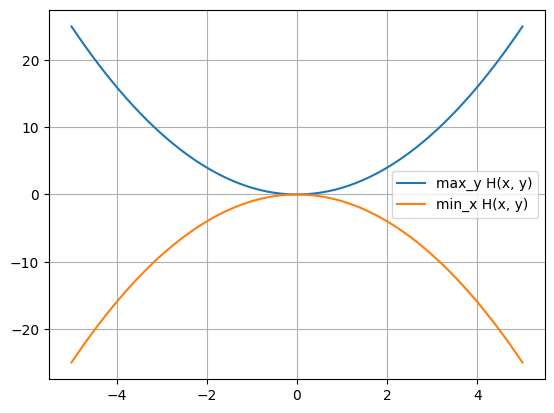

Optimal dual gap in [-4,4]x[-4,4] is 0.000000


In [6]:
# FIRST FUNCTION
H1 = np.power(xx, 2) - np.power(yy, 2)
surf_and_contour(x, y, H1, label='H1(x,y) = x^2 - y^2')

optimal_dual_gap = compute_dual_gap(x, y, H1)
print('Optimal dual gap in [-4,4]x[-4,4] is %f' % optimal_dual_gap)

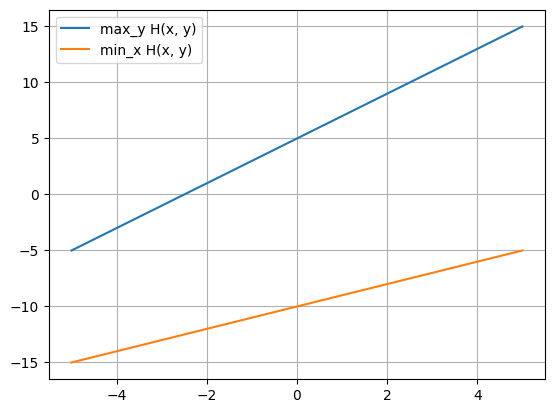

Optimal dual gap in [-4,4]x[-4,4] is 0.000000


In [7]:
# SECOND FUNCTION
H2 = 2 * xx + yy
surf_and_contour(x, y, H2, label='f2(x,y) = 2x + y')

optimal_dual_gap = compute_dual_gap(x, y, H2)
print('Optimal dual gap in [-4,4]x[-4,4] is %f' % optimal_dual_gap)

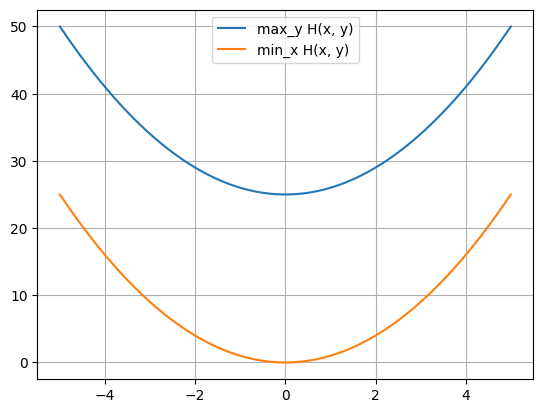

Optimal dual gap in [-4,4]x[-4,4] is 0.000000


In [8]:
# THIRD FUNCTION
H3 = np.power(xx, 2) + np.power(yy, 2)
surf_and_contour(x, y, H3, label='H3(x,y) = x^2 + y^2')

optimal_dual_gap = compute_dual_gap(x, y, H3)
print('Optimal dual gap in [-4,4]x[-4,4] is %f' % optimal_dual_gap)

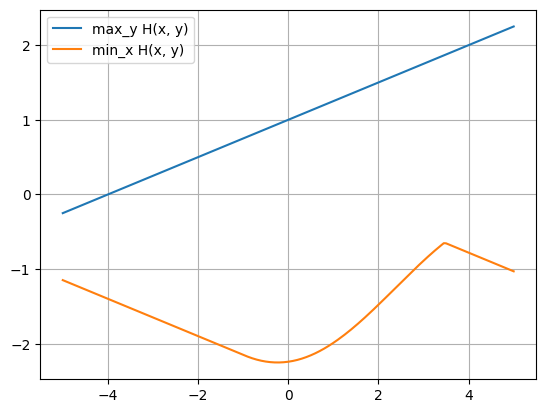

Optimal dual gap in [-4,4]x[-4,4] is 0.402166


In [9]:
# FOURTH FUNCTION
H4 = np.cos((3 / 5) * (xx + yy)) + 0.25 * xx
surf_and_contour(x, y, H4, label='f4(x,y) = cos(3/5(x + y)+x/4)')

optimal_dual_gap = compute_dual_gap(x, y, H4)
print('Optimal dual gap in [-4,4]x[-4,4] is %f' % optimal_dual_gap)

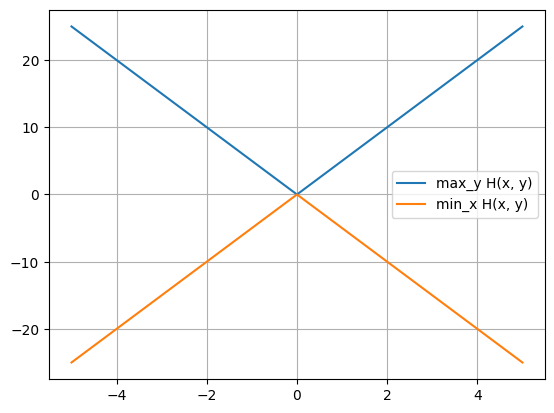

Optimal dual gap in [-4,4]x[-4,4] is 0.000000


In [10]:
# FIFTH FUNCTION
H5 = xx*yy
surf_and_contour(x, y, H5, label='f5(x,y) = xy')

optimal_dual_gap = compute_dual_gap(x, y, H5)
print('Optimal dual gap in [-4,4]x[-4,4] is %f' % optimal_dual_gap)

<font color='red'>**ANSWER**</font>
a)
 1. Saddlepoint at (0,0) 
 2. No Saddlepoint
 3. No Saddlepoint
 4. No Saddlepoint
 5. Saddlepoint at (0,0)

b) 
If there exists a Saddlepoint the dual gap is 0. As we can see in the plot results both graphic 1 and 5 have a dual gap of 0.




# The primal-dual and the dual method

We will now exploit min-max duality theory to minimize functions $ f:\mathbb{R}^n\to\mathbb{R}$ of the form:
$$
f(x)=\| Ax \|_{\mathbb R^m} + \frac{1}{2\lambda} \| x-b\|_{\mathbb R^n}^2
$$
where $A$ is a $m\times n$ matrix and $b\in \mathbb{R}^n$. This function has a particularity: since the first norm is not squared, it is not differentiable when $Ax=0$. This creates a difficulty: all the minimization algorithms we've seen so far use $\nabla f$ in a way or another. Here we cannot use it, since $\nabla f$ is not defined when $Ax=0$. In this assignment we will see a trick to deal with this issue.


**Removing the non-differentiability with an auxiliary variable**

We can remove the non-differentiability by formulating an equivalent problem with an additional variable. It all resides in the following observation:

\begin{equation}
  \| x\|_{\mathbb R^n} = \max\limits_{\| y\|_{\mathbb R^n}\leq 1} \langle x,y\rangle_{\mathbb R^n}. \qquad (1)
\end{equation}

Applying this to our problem, we have that

$$
f(x) = \max\limits_{y\in C} H(x,y) \; \text{ where } H(x,y)= \langle Ax,y\rangle_{\mathbb R ^m} + \frac{1}{2 \lambda} \|x-b\|^2_{\mathbb R^n},
$$

where we have defined the feasible set for $y$ as $ C = \{y \in \mathbb R^m : \|y\|_{\mathbb R^m} \leq 1 \}$, the set of vectors with norm less or equal to one. Since we want to minimize $f$, we are interested in finding

$$
\min\limits_x \max \limits_{y\in C} H(x,y).
$$

So far we haven't done much. We changed our original non-differentiable problem by another one, a min-max problem.

The following observation will help us. $H$ has very particular properties: for any fixed $x$, $H(x,\cdot)$ is a concave function. On the other hand $H(\cdot,y)$ is convex, for any fixed $y$. This implies that we can exchange the min with the max. The result is a max-min problem:

$$
  \min\limits_x \max \limits_{y\in C} H(x,y) = H(x^*,y^*) = \max \limits_{y\in C} \min \limits_x H(x,y). \quad (2)
$$

Here $(x^*,y^*)$ is the solution of the min-max and max-min problems. It can be shown that $(x ^*,y^*)$ is a saddle point of $H$.


Eq. (2) provides an alternative problem (the max-min) which is equivalent to the original min-max problem. We are going to see two ways of solving the max-min problem:

1. **The dual method**: Eliminating $x$ by solving first the min part. Then, solving the max problem of a function that only depends on $y$. This function is called the dual function, and $y$ is called the dual variable. Correspondingly $f$ is called the primal function and $x$ is the primal variable.
2. **The primal-dual method**: Solving for $x$ and $y$ simultaneously, finding a saddle-point of $H$. This approach is called primal-dual.

Let us start by explaining the latter.

## The primal-dual problem

A saddle point is a maximum of $H$ with respect to $y$ and a minimum with respect to $x$. A simple algorithm for computing a saddle-point is then to update the dual variable with a gradient ascent on $y$ and the primal with a gradient descent on $x$. Note that since the maximization on $y$ is constrained, we will use a projected gradient ascent.

<font color='blue'>**(QUESTION 2)** Show that the partial gradients of $H$, $\nabla_xH$ and $\nabla_yH$ with respect to $x$ and $y$ are given by
$$
\nabla_x H(x,y) = A^Ty + \frac{1}{\lambda}(x-b)
$$

$$
\nabla_y H(x,y) = Ax
$$
</font>

<font color='red'>**ANSWER**</font>
$$
D_v H(x,y) = \lim_{h\to 0}\begin{pmatrix}
\frac{H(x+hv,y)-H(x,y)}{h}\\
\frac{H(x,y+hv)-H(x,y)}{h}
\end{pmatrix}
$$

If we expand on the first element looking forward to compute $\nabla_x H(x,y)$:
$$
\lim_{h\to 0} \frac{H(x+hv,y)-H(x,y)}{h} 
= \lim_{h\to 0} \frac{\langle A(x+hv),y\rangle + \frac{1}{2\lambda}\langle x-b+hv,x-b+hv\rangle -\langle Ax,y\rangle - \frac{1}{2\lambda}\langle x-b,x-b\rangle}{h}
$$
$$
= \lim_{h\to 0} \frac{\langle Ax,y\rangle + h\langle Av,y\rangle + \frac{1}{2\lambda}(2h\langle x-b,v\rangle+\langle x-b,x-b\rangle+h^2\langle v,v\rangle)-\langle Ax,y\rangle - \frac{1}{2\lambda}\langle x-b,x-b\rangle}{h}
$$
simplifying,
$$
= \lim_{h\to 0} \frac{h\langle Av,y\rangle + \frac{h}{\lambda}\langle x-b,v\rangle + \frac{h^2}{2\lambda}\langle v,v\rangle)}{h}
$$
$$
= \langle Av,y\rangle + \frac{1}{\lambda}\langle x-b,v\rangle
= \langle A^Ty,v\rangle + \frac{1}{\lambda}\langle x-b,v\rangle
= \langle A^Ty+ \frac{1}{\lambda}(x-b),v\rangle
$$
Finally,
$$
\nabla_x H(x,y) = A^Ty + \frac{1}{\lambda}(x-b)
$$
$$
\because D_v F(x) = \langle \nabla_x F(x),v\rangle
$$

Now we will expand the second term looking forward to compute $\nabla_y H(x,y)$:
$$
\lim_{h\to 0} \frac{H(x,y+hv)-H(x,y)}{h}
=\lim_{h\to 0} \frac{\langle Ax,y+hv\rangle + \frac{1}{2\lambda}\langle x-b,x-b\rangle -\langle Ax,y\rangle - \frac{1}{2\lambda}\langle x-b,x-b\rangle}{h}
$$
$$
=\lim_{h\to 0} \frac{\langle Ax,y\rangle + h\langle Ax,v\rangle -\langle Ax,y\rangle}{h}
=\lim_{h\to 0} \frac{h\langle Ax,v\rangle}{h}
$$
$$
=\langle Ax,v\rangle
$$
$$
\therefore \nabla_y H(x,y) = Ax
$$

This yields the following update equations:
$$
x^{k+1}=x^k - \theta \left(A^Ty^k + \frac{1}{\lambda}(x^k-b)\right)
$$

$$
y^{k+1} = P_C(y^k + \delta A x^{k+1})
$$

Here $\delta, \theta$ are time steps that have to be specified, and $P_C$ is a projector over $C$. Given any vector $\nu \in \mathbb R^m$, we have that

$$
P_C(\nu)=\frac{\nu}{\max\big\{1, \|\nu\|_{\mathbb R^m}\big\}}.
$$

<font color='blue'>**(QUESTION 3)** Complete the function `toy_primal_dual` defined below. Follow the comments provided in the code.
</font>

In [11]:
def toy_primal_dual(A, b, lambda_, x, pd_prms, fig_data = None):
    """
    toy_primal_dual - minimizes a non-differentiable function f:R^n--> R of the
    form

       f(x) = ||Ax|| + 1/(2*lambda)*||x-b||^2.

    using a form of duality to remove the non-differentiability. It transforms
    the problem into a max-min problem, solved numerically with a gradient
    descent and gradient ascent.

    [x,y] = toy_primal_dual (A, b, lambda, x, pd_prms)

    :param A       : mxn matrix (n is the dimension of x)
    :param b       : nx1 vector
    :param lambda  : weight between two terms
    :param x       : nx1 initial condition for primal variable
    :param pd_prms : a structure with the dual maximization parameters. Needs to have
                     the following fields:

                        :param delta     : dual gradient ascent step size
                        :param theta     : primal gradient descent step size
                        :param max_iters : maximum number of iterations
                        :param tolerance : tolerance for the stopping condition (it stop when
                                           the norm of the gradient is below the tolerance)

    :return x     : primal value found (nx1)
    :return y     : dual   value found (mx1)
    :return fps   : evolution of the primal function (total_iters x 1 vector)
    :return fds   : evolution of the dual function (total_iters x 1 vector)
    """
    # Get all the params
    tolerance = pd_prms.get("tolerance")
    max_iters = pd_prms.get("max_iters")
    delta     = pd_prms.get("delta")
    theta     = pd_prms.get("theta")

    # initialize dual to 0
    y = 0 * x

    # vectors with function values
    fps = []
    fds = []

    # begin projected gradient ascent
    it = 0
    dual_gap = np.inf
    while (dual_gap > tolerance) and (it < max_iters):
        # Increment the iteration
        it = it + 1

        # Save the current value, just for displaying
        x_old = x
        y_old = y

        # TODO: update x by gradient descent with step theta
        x = x_old - theta*( A.T @ y_old + (1/lambda_)*(x_old - b))
        # TODO: update y by gradient ascent with step delta
        y = y_old + delta * A @ x
        # TODO: project y over constraint set
        y = y / max(1,np.linalg.norm(y))

        # compute primal energy
        P_data = (1 / 2 / lambda_) * np.power(x - b, 2).sum()
        P = np.linalg.norm(np.dot(A, x)) + P_data

        # compute dual energy
        Aty = np.dot(A.T, y)
        D = np.dot(b.T, Aty) - lambda_ / 2 * np.power(Aty, 2).sum()

        # compute primal dual energy
        PD = np.dot(np.dot(A, x).T, y) + P_data

        # TODO: update dual gap
        dual_gap = P - D

        # Update the arrays
        fps.append(P)
        fds.append(D)

        # Update the plot
        if fig_data is not None:
            # ----
            if x.shape[0] == 2 and x.shape[1] == 1:
                fig_data[1].plot([x_old[0, 0], x[0, 0]],
                                 [x_old[1, 0], x[1, 0]], "-k")
                fig_data[2].plot([y_old[0, 0], y[0, 0]],
                                 [y_old[1, 0], y[1, 0]], "-k")
                fig_data[3].scatter(x[0, 0], x[1, 0], P, marker = "o", color = "k")
                fig_data[4].scatter(y[0, 0], y[1, 0], D, marker = "o", color = "k")

            elif x.shape[0] == 1 and x.shape[1] == 1:
                fig_data[1].plot(x, P, marker = '.', color = "k")
                fig_data[2].plot(y, D, marker = '.', color = "k")
                fig_data[3].plot([x_old[0, 0], x[0, 0]],
                                 [y_old[0, 0], y[0, 0]], "-k")
                fig_data[4].scatter(x, y, PD, marker = "o", color = "k")

            else:
                pass
            # ----
            display.clear_output(wait=True)
            display.display(fig_data[0])

        # Print the current values
        print('[It. {0} of {1}] f( x(k) ) - g( y(k) )| = {2}'.format(it, max_iters,dual_gap))

    return x, y, fps, fds

## The dual problem: constrained maximization

The dual problem is obtained from the max-min problem by solving first the min part:

$$
 \min \limits_x H(x,y) = \min\limits_x \langle Ax,y \rangle _{\mathbb R^m} + \frac{1}{2\lambda} \|x-b\|^2_{\mathbb R^n}.
$$

This is an unconstrained minimization problem with a differentiable objective function. It is in fact, a quadratic function of $x$, and for each $y$ there is a unique minimizer $x^*(y)$ (this minimizer depends on $y$).

<font color='blue'>**(QUESTION 4)** Show that $x^*(y)$ (the minimizer of $H(x,y)$ with respect to $x$ by keeping fixed $y$) is given by $x^*(y) = b-\lambda A^Ty.$
</font>

<font color='red'>**ANSWER**</font>

$$
 \min \limits_x H(x,y) = \min\limits_x \langle Ax,y \rangle _{\mathbb R^m} + \frac{1}{2\lambda} \|x-b\|^2_{\mathbb R^n} \\
 \min H(x,y) = 0 \\
 \nabla_x H(x,y) = A^Ty + \frac{1}{\lambda} (x-b) = 0 \\
 \frac{1}{\lambda} (x-b) = -A^Ty \\
 (x-b) = - \lambda A^Ty \\
 x = b - \lambda A^Ty \\
$$ 




Substituting $x^*(y)$ one obtains the dual function:

$$
g(y) = \min \limits_x H(x,y) = H(x^*(y),y) = \langle Ab,y \rangle_{\mathbb R^m} - \frac{\lambda}{2} \| A^Ty \|^2_{\mathbb R^m}.
$$

Once the min part is solved, we only have to solve the max part. This is the dual problem:

$$
\max\limits_{y\in C} g(y) = \max_{y\in C} \langle Ab,y \rangle_ {\R^m} - \frac{\lambda}{2} \|A^Ty\|^2_{\mathbb R^m}
$$

Observe that this is a quadratic problem with constraints, where we have eliminated the primal variable. We can solve it with a projected gradient ascent.

<font color='blue'>**(QUESTION 5)** Show that $\nabla g(y)$ is given by $\nabla g(y) = Ab - \lambda AA^Ty$.
</font>

<font color='red'>**ANSWER**</font>

So first we have that 
$$ 
g(y) = \langle Ab,y \rangle_{\mathbb R^m} - \frac{\lambda}{2} \| A^Ty \|^2_{\mathbb R^m}\\
$$ 
To calculate $\nabla g(y)$ we perform the directional derivative through the following limit:
$$ 
\lim_{h\to 0} \frac{g(y+hv)-g(y)}{h} = \\
\lim_{h\to 0} \frac{\langle Ab, y + hv\rangle - \frac{\lambda}{2}\langle A^T (y + hv),  A^T (y + hv) \rangle - \langle Ab, y \rangle + \frac{\lambda}{2} \langle A^Ty, A^Ty \rangle }{h} = \\
\lim_{h\to 0} \frac{\langle Ab,y\rangle + \langle Ab, hv \rangle - \frac{\lambda}{2}(\langle A^Ty, A^Ty\rangle + \langle A^Ty, A^Thv\rangle + \langle A^Thv, A^Ty\rangle+  \langle A^Thv, A^Thv\rangle ) - \langle Ab, y \rangle + \frac{\lambda}{2} \langle A^Ty, A^Ty \rangle }{h} = \\
\lim_{h\to 0} \frac{h\langle Ab, v\rangle - \frac{\lambda}{2}(\langle A^Ty, A^Ty\rangle + 2h\langle A^Ty, A^Tv \rangle + h²\langle A^Tv, A^Tv\rangle - \frac{\lambda}{2} \langle A^Ty, A^Ty \rangle ) }{h} = \\
\langle Ab, v\rangle - \lambda \langle A^Ty, A^Tv\rangle = \langle Ab - \lambda AA^Ty, v\rangle
$$
since:
$$ 
\lambda \langle A^Ty, A^Tv \rangle = \lambda \langle AA^Ty, v\rangle 
$$
and 
$$
\because D_v F(x) = \langle \nabla_x F(x),v\rangle 
$$
we have:
$$
\nabla g(y) = Ab -\lambda AA^Ty
$$


Note that we can express $\nabla g(y)$ as $\nabla g(y) = A(b -\lambda A^Ty) = Ax^*(y)$. Putting all of this together, we get the following maximization scheme. We start from $y^0 \in C $ (for example $y = 0$) and we use a time step $\delta$. Then, iterate:

$$
y^{k+1} = P_C(y^k + \delta Ax^*(y^k)).
$$

Once we compute the dual optimum, say $y^*$, we can recover the primal optimum by substituting $y^*$ into $x^* = x^*(y^*)$.

## The dual gap and the stopping condition


As a criterion for the stopping condition for our iterative algorithms we will use the dual gap:

$$\text{DG}(x,y) = f(x) - g(y).$$

From the properties of min-max problems of the first part we know that

$$f(x) \geq f(x^*) = H(x^*,y^*) = g(y^*) \geq g(y).$$

This implies that $f(x)- g(y) \geq f(x)- f(x^*) \geq 0$. This means that the dual gap bounds the error between the current estimate $f(x)$ and the minimum $f(x^*)$.




## A problem with one primal and one dual variable

<font color='blue'>**(QUESTION 6)** Complete the function `toy_dual` defined below. Follow the comments provided in the code.
</font>

In [12]:
def toy_dual(A, b, lambda_, d_prms, fig_data = None):
    """
    toy_dual - minimizes a non-differentiable function f:R^n --> R of the form

       f(x) = ||Ax|| + 1/2/lambda*|| x - b ||^2.

    using a form of duality to remove the non-differentiability. It transforms
    the problem into a max-min problem, eliminates the primal by solving the min
    analytically, and solves the max numerically with a gradient ascent.

    [x,y] = toy_dual (A, b, lambda, d_prms)

    :param A      : mxn matrix (n is the dimension of x)
    :param b      : nx1 vector
    :param lambda : weight between two terms
    :param d_prms : a structure with the dual maximization parameters. Needs to have
                    the following fields:
                   :param delta     : gradient ascent step size
                   :param max_iters : maximum number of iterations
                   :param tolerance : tolerance for the stopping condition (it stop when
                                      the norm of the gradient is below the tolerance)

    :return x     : primal value found (nx1)
    :return y     : dual   value found (mx1)
    :return fps   : evolution of the primal function (total_iters x 1 vector)
    :return fds   : evolution of the dual function (total_iters x 1 vector)
    """
    # Get all the params
    tolerance = d_prms.get("tolerance")
    max_iters = d_prms.get("max_iters")
    delta     = d_prms.get("delta")

    # Initialization
    y = np.zeros((len(A), 1))

    # TODO: Initialize x
    x = (b - lambda_ * A.T @ y)

    # vectors with function values
    fps = []
    fds = []

    # begin projected gradient ascent
    it = 0
    dual_gap = np.inf
    while (dual_gap > tolerance) and (it < max_iters):
        # Increment the iteration
        it = it + 1

        # Save the current value, just for displaying
        y_old = y

        # TODO: update y by gradient ascent with step delta
        y = y + delta * A @ x

        # project y over constraint set
        y =  y / max(1,np.linalg.norm(y))

        # Save the current value, just for displaying
        x_old = x

        # TODO: compute primal variable as x^*(xi)
        x = b - lambda_ * A.T @ y

        # compute primal energy
        P_data = (1 / 2 / lambda_) * np.power(x - b, 2).sum()
        P = np.linalg.norm(np.dot(A, x)) + P_data

        # compute dual energy
        Aty = np.dot(A.T, y)
        D = np.dot(b.T, Aty) - lambda_ / 2 * np.power(Aty, 2).sum()

        # compute primal dual energy - only for plotting
        PD = np.dot(np.dot(A, x).T, y) + P_data

        # TODO: update dual gap
        dual_gap = P - D

        # Update the arrays
        fps.append(P)
        fds.append(D)

        # Update the plot
        if fig_data is not None:
            # ----
            if x.shape[0] == 2 and x.shape[1] == 1:
                fig_data[1].plot([x_old[0, 0], x[0, 0]],
                                 [x_old[1, 0], x[1, 0]], "-k")
                fig_data[2].plot([y_old[0, 0], y[0, 0]],
                                 [y_old[1, 0], y[1, 0]], "-k")
                fig_data[3].scatter(x[0, 0], x[1, 0], P, marker = "o", color = "k")
                fig_data[4].scatter(y[0, 0], y[1, 0], D, marker = "o", color = "k")

            elif x.shape[0] == 1 and x.shape[1] == 1:
                fig_data[1].plot(x, P, marker = '.', color = "k")
                fig_data[2].plot(y, D, marker = '.', color = "k")
                fig_data[3].plot([x_old[0, 0], x[0, 0]],
                                 [y_old[0, 0], y[0, 0]], "-k")
                fig_data[4].scatter(x, y, PD, marker = "o", color = "k")

            else:
                pass
            # ----
            display.clear_output(wait=True)
            display.display(fig_data)

        # Print the current values
        print('[It. {0} of {1}] f( x(k) ) - g( y(k) ) = {2}'.format(it, max_iters,dual_gap))

    return x, y, fps, fds

<font color='blue'>**(QUESTION 7)** Use the cells below to run the primal dual and dual method for a toy problem with a single variable.
- <font color='blue'>Explain what the displayed plots show
- Which algorithm exhibits faster convergence
- Run both algorithms for lambda = 3 and lambda = 10. How is the trajectory of the primal-dual variable $(x_y, y_k)$ for the *primal-dual algorithm* (specially noticeable for lambda = 10)?
- For the *dual* algorithm, how is the trajectory of the *primal-dual variable* $x_k, y_k$? Why is that?

Give your answer in the <font color='red'>**ANSWER**</font> boxes underneath.
</font>

In [13]:
def plot_toy_problem_R1(A, b, lambda_):
    """
    Function that prepares 4 plots that will be used to display the evolution
    of the iterations of the primal dual and dual methods.

    The four plots are:
    - the primal function f
    - the dual function g
    - countour and surf plots of the primal-dual function H

    The function returns the handles to the figure and the four axes.
    This handles need to be passed as input to the dual and primal dual solvers.
    """

    # vector x to plot primal function
    x = np.matrix(np.arange(start = -5, stop = 5.01, step = .01))
    pmg_sz = len(x)

    # vector y to plot dual function
    y = np.matrix(np.arange(start = -1.1, stop = 1.1, step = .01))
    dmg_sz = len(y)

    # compute primal function on x
    Ax = A * x
    f1 = np.sqrt(np.power(Ax, 2))
    f2 = np.power(x - np.tile(b, [1, pmg_sz]), 2)
    f  = f1 + (1 / (2 * lambda_)) * f2

    # compute dual function on y
    Aty = A.T * y
    g = np.dot(b.T, Aty) - lambda_ / 2 * np.power(Aty, 2)
    g = np.where(np.power(y, 2) > 1, np.nan, g)

    # compute primal-dual function on a primal-dual grid
    X, Y = np.meshgrid(x,y) # this is a primal-dual grid
    pdmg_sz = len(X)

    H = np.tile(f2, [dmg_sz, 1]) / (2 * lambda_) + y.T * Ax
    H = np.where(np.power(Y, 2) > 1, np.nan, H)

    # plots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (14, 8))
    ax4 = fig.add_subplot(2, 2, 4, projection='3d')
    ax1.plot(np.array(x)[0], np.array(f)[0])
    ax2.plot(np.array(y)[0], np.array(g)[0])

    ax3.contour(X, Y, H,
                corner_mask = False, levels = 150,
                linewidths=(1,), cmap = cm.coolwarm)
    ax3.grid()

    ax4.plot_surface(X, Y, H, cmap=cm.coolwarm,
                     linewidth=0, antialiased=False,
                     vmax=1)

    ax1.set_title("Primal")
    ax2.set_title("Dual")
    ax3.set_title("Primal Dual")
    ax4.set_title("Primal Dual")

    return fig, ax1, ax2, ax3, ax4

KeyboardInterrupt: 

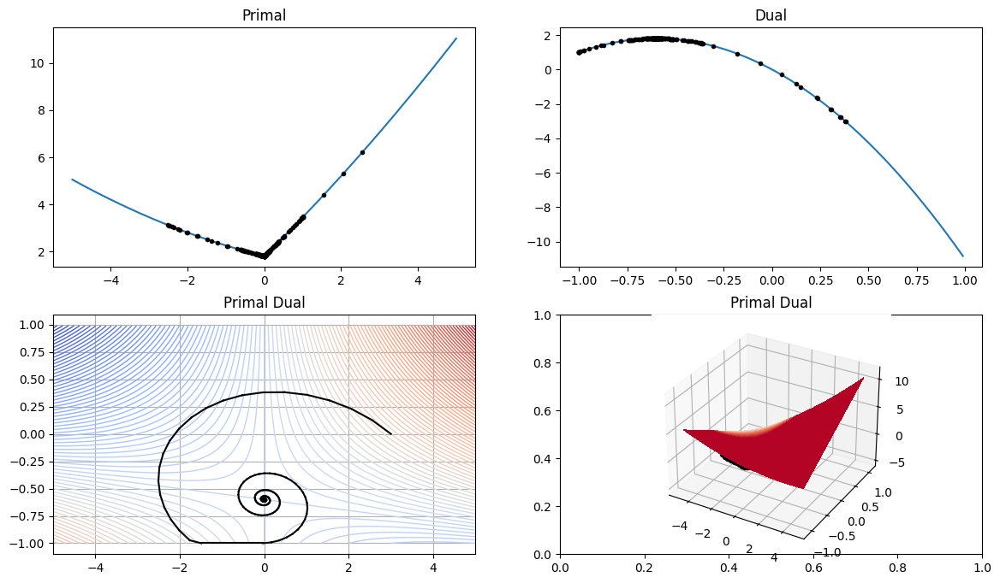

In [19]:
# parameters of primal function
A = np.identity(n = 1)
b = np.matrix([-6])
lambda_ = 10  # TRY also lambda_ = 10

fig_data_r1 = plot_toy_problem_R1(A, b, lambda_)

# run primal dual
x0 = np.matrix([3])
pd_prms = {"delta": 0.05,
           "theta": 0.5,
           "max_iters": 1000,
           "tolerance": 1e-8}

x, y, fps, fds = toy_primal_dual(A, b, lambda_, x0, pd_prms, fig_data_r1)

(<Figure size 1400x800 with 5 Axes>,
 <Axes: title={'center': 'Primal'}>,
 <Axes: title={'center': 'Dual'}>,
 <Axes: title={'center': 'Primal Dual'}>,
 <Axes3D: title={'center': 'Primal Dual'}>)

[It. 87 of 1000] f( x(k) ) - g( y(k) ) = [[8.89283247e-09]]


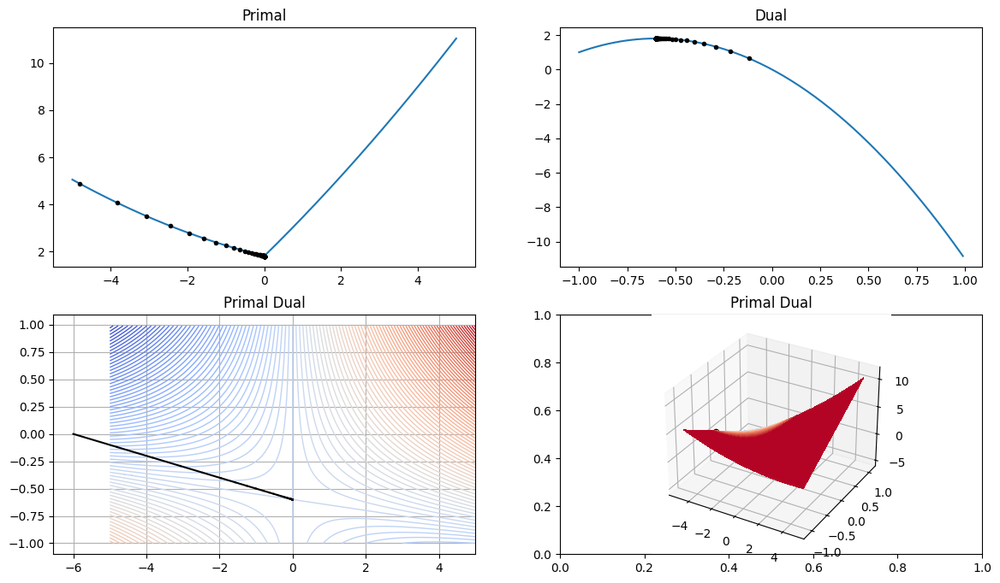

In [15]:
# parameters of primal function
A = np.identity(n = 1)
b = np.matrix([-6])
lambda_ = 10 # TRY also lambda_ = 10

fig_data_r1 = plot_toy_problem_R1(A, b, lambda_)

d_prms = {"delta": 2e-2,
          "max_iters": 1000,
          "tolerance": 1e-8}
x, y, fps, fds = toy_dual(A, b, lambda_, d_prms, fig_data_r1)

<font color='red'>**ANSWER**</font>

1. In the plots we can se the evolution of both the primal and dual functions to minimize a problem by reaching convergence to the minimum.
2. The dual algorithm converges way faster than the primal_dual one.
3. When running the algorithm primal_dual with lambda 10 the shape that the primal dual variable has is that of a spiral, we could even say it resembles a golden spiral.
4. When running the dual algorithm the shape of the Primal Dual variable is a straight line, since we are using the gradient ascent to the find the maxima of the whole function and not a local minima as with the primal algorithm with GD.

## A problem with two primal and two dual variables

<font color='blue'>**(QUESTION 8)** Use the cells below to run the primal dual and dual method for a toy problem with two primal and two dual variables.
- <font color='blue'>Explain the what the displayed plots show
- For the primal dual algorithm, do the trajectories of the primal $x_k$ variable and dual $y_k$ resemble a gradient descent/ascent? What about for the dual algorithm? Justify your answer.
- Run both algorithms for lambda = 4 and lambda = 12. When the solution of the dual is on the interior of the unit disc, where is the solution of the primal problem?

Give your answer in the <font color='red'>**ANSWER**</font> boxes underneath.
</font>

In [16]:
def plot_toy_problem_R2(A, b, lambda_):
    """
    Function that prepares 4 plots that will be used to display the evolution
    of the iterations of the primal dual and dual methods.

    In this case x and y are two dimensional variables. Therefore, H(x,y) is a
    function of 4 variables and we cannot plot it. We only plot the primal and
    the dual functions. For each of them, we will plot a surface and a contour
    plot.

    The function returns the handles to the figure and the four axes.
    This handles need to be passed as input to the dual and primal dual solvers.
    """
    # primal mesh to draw primal function
    xx1 = np.matrix(np.arange(start = -15, stop = 10.1, step = .1))
    xx2 = np.matrix(np.arange(start = -10, stop = 15.1, step = .1))
    [x1, x2] = np.meshgrid(xx1, xx2)
    x = np.vstack((x1.T.flatten(), x2.T.flatten()))
    pmg_sz = x1.shape

    # dual mesh to draw dual function
    xy1 = np.matrix(np.arange(start = -1.1, stop = 1.1, step = .01))
    xy2 = np.matrix(np.arange(start = -1.1, stop = 1.1, step = .01))
    [y1, y2] = np.meshgrid(xy1, xy2)
    y = np.vstack((y1.T.flatten(), y2.T.flatten()))
    dmg_sz = y1.shape


    # compute primal function on primal grid
    Ax = np.dot(A, x)
    f1 = np.sqrt(np.power(Ax, 2).sum(axis = 0))
    f2 = np.power(x - np.tile(b, [1, np.prod(pmg_sz)]), 2).sum(axis = 0)
    f  = np.reshape(f1, pmg_sz).T + (1 / (2 * lambda_)) * np.reshape(f2, pmg_sz).T

    # compute dual function on dual grid
    Aty = np.dot(A.T, y)
    g = np.reshape(np.dot(b.T, Aty) - lambda_ / 2 * np.power(Aty,  2).sum(axis = 0), dmg_sz).T
    g = np.where((np.power(y, 2).sum(axis = 0) > 1).reshape(dmg_sz), np.nan, g)

    # ------- #
    # PLOT
    # ------- #
    # Make the plots

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (14, 8))
    ax3 = fig.add_subplot(2, 2, 3, projection='3d')
    ax4 = fig.add_subplot(2, 2, 4, projection='3d')

    ax1.contour(x1, x2, f,
            corner_mask = False, levels = 150,
            linewidths=(1,), cmap = cm.coolwarm)
    ax1.grid()
    ax1.set_aspect('equal', adjustable='box')

    ax2.contour(y1, y2, g,
                corner_mask = False, levels = 150,
                linewidths=(1,), cmap = cm.coolwarm)
    ax2.grid()
    ax2.set_aspect('equal', adjustable='box')

    ax3.plot_surface(x1, x2, f, cmap=cm.coolwarm, linewidth=0, antialiased=False)
    ax4.plot_surface(y1, y2, g, cmap=cm.coolwarm, linewidth=0, antialiased=False)

    ax1.set_title("Primal function")
    ax2.set_title("Dual function")
    ax3.set_title("Primal function")
    ax4.set_title("Dual function")

    return fig, ax1, ax2, ax3, ax4

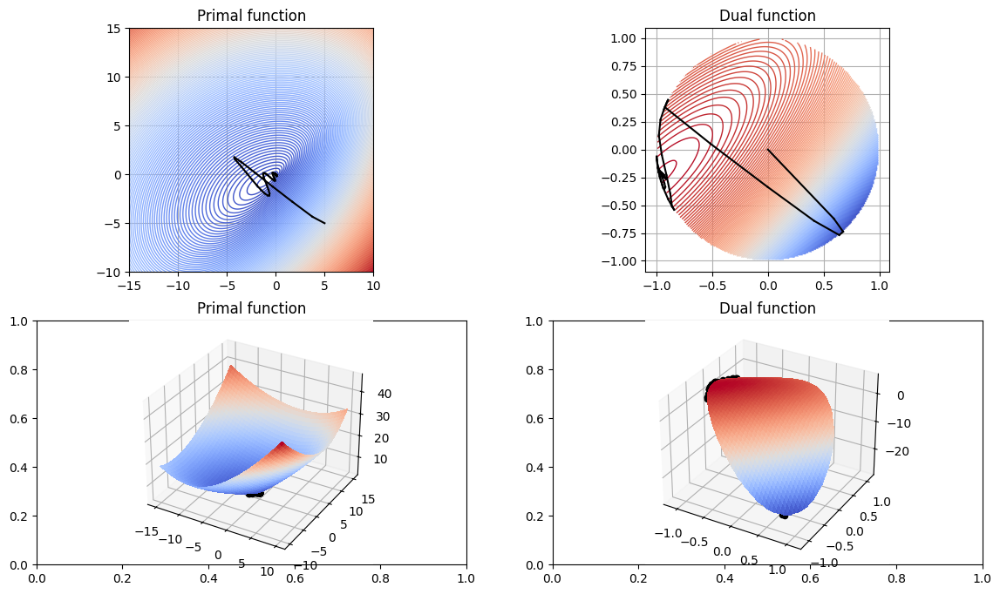

[It. 125 of 1000] f( x(k) ) - g( y(k) )| = [[7.02467095e-05]]


In [26]:
# parameters of primal function
A = np.matrix([[1, -.5], [-.5, 1]])
b = np.matrix([[-10], [3]])
lambda_ = 12 # TRY also lambda = 12

fig_data_r2 = plot_toy_problem_R2(A, b, lambda_)

# primal dual ----------------------------------------------
pd_prms = {"tolerance": 1e-4,
           "delta": 1e-1,
           "theta": 1e-0,
           "max_iters": 1000}
x_star, y_star, fps, fds = toy_primal_dual(A, b, lambda_, np.matrix([[5], [-5]]), pd_prms, fig_data_r2)

(<Figure size 1400x800 with 6 Axes>,
 <Axes: title={'center': 'Primal function'}>,
 <Axes: title={'center': 'Dual function'}>,
 <Axes3D: title={'center': 'Primal function'}>,
 <Axes3D: title={'center': 'Dual function'}>)

[It. 7 of 1000] f( x(k) ) - g( y(k) ) = [[6.73831504e-05]]


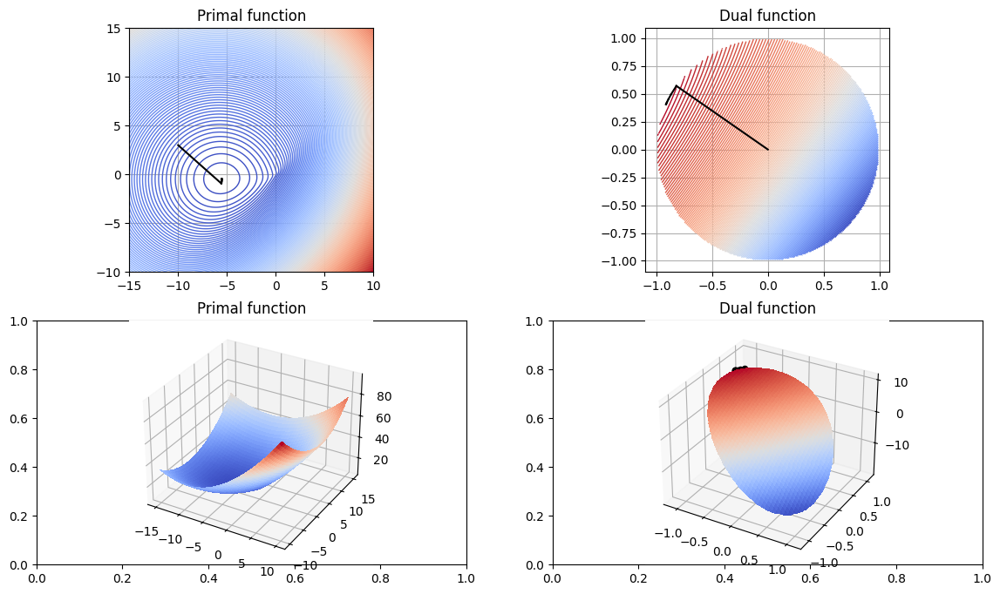

In [23]:
# parameters of primal function
A = np.matrix([[1, -.5], [-.5, 1]])
b = np.matrix([[-10], [3]])
lambda_ = 12 # TRY also lambda = 12

fig_data_r2 = plot_toy_problem_R2(A, b, lambda_)

# dual
d_prms = {"tolerance": 1e-4,
          "delta": 1e-1,
          "max_iters": 1000}
x_star, y_star, fps, fds = toy_dual(A, b, lambda_, d_prms, fig_data_r2)

<font color='red'>**ANSWER**</font>
1. These plots as before show the dual and primal algorithms path to convergence.
2. For the primal variable the plots seem to resemble the usual gradient and ascent trajectories in both dual and primal alogrithms, while the plot of the dual gives a different insight on the trajectory.
3. For lambda 12 the dual algorithm doesnt converge, as for the primal algorithm when the solution of the dual problem is on the interior the solution of the primal problem is also on the interior of the unit disc.

